# **5MIN OMNI Dataset for OCB Model**

**Author:** Arnav Singh 
**Date:** 2024-08-15

---

## **Abstract**

For this notebook, the 5MIN merged OMNI dataset will be used including variables such as Kp, 

## **Keywords**

- Keyword 1
- Keyword 2
- Keyword 3

---

## **Table of Contents**

1. [Introduction](#introduction)
2. [Data Description](#data-description)
3. [Data Preprocessing](#data-preprocessing)
4. [Exploratory Data Analysis](#exploratory-data-analysis)
5. [Feature Engineering](#feature-engineering)
6. [Model Selection](#model-selection)
7. [Model Training](#model-training)
8. [Model Evaluation](#model-evaluation)
9. [Hyperparameter Tuning](#hyperparameter-tuning)
10. [Results and Discussion](#results-and-discussion)
11. [Conclusion](#conclusion)
12. [References](#references)
13. [Appendix](#appendix)

---

## **Introduction**

Introduce the problem statement, background information, and the significance of the modeling project.

---

In [1]:
## Importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
fiveOmni_df = pd.read_csv('data/OMNI_HRO_5MIN_2996238.csv', comment='#')
# Convert first column to datetime
fiveOmni_df['EPOCH_TIME_yyyy-mm-ddThh:mm:ss.sssZ'] = pd.to_datetime(
    fiveOmni_df['EPOCH_TIME_yyyy-mm-ddThh:mm:ss.sssZ'], 
    utc=True)
fiveOmni_df.head()

,EPOCH_TIME_yyyy-mm-ddThh:mm:ss.sssZ,TIMESHIFT_seconds,MAG_AVG_B-VECTOR_nT,BX__GSE_nT,BY__GSM_nT,BZ__GSM_nT,FLOW_SPEED__GSE_km/s,VX_VELOCITY__GSE_km/s,VY_VELOCITY__GSE_km/s,VZ_VELOCITY__GSE_km/s,PROTON_DENSITY_n/cc,FLOW_PRESSURE_nPa,5-M_AE_nT,5-M_AL-INDEX_nT,SYM/H_INDEX_nT,5-M_PC(N)-INDEX_
0,1983-12-01 00:00:00+00:00,999999,9999.99,9999.99,9999.99,9999.99,99999.9,99999.9,99999.9,99999.9,999.99,99.99,220,-151,-25,0.77
1,1983-12-01 00:05:00+00:00,999999,9999.99,9999.99,9999.99,9999.99,99999.9,99999.9,99999.9,99999.9,999.99,99.99,190,-125,-26,0.55
2,1983-12-01 00:10:00+00:00,999999,9999.99,9999.99,9999.99,9999.99,99999.9,99999.9,99999.9,99999.9,999.99,99.99,206,-114,-27,0.87
3,1983-12-01 00:15:00+00:00,999999,9999.99,9999.99,9999.99,9999.99,99999.9,99999.9,99999.9,99999.9,999.99,99.99,193,-115,-27,1.32
4,1983-12-01 00:20:00+00:00,999999,9999.99,9999.99,9999.99,9999.99,99999.9,99999.9,99999.9,99999.9,999.99,99.99,225,-140,-28,1.27


Over 3 million rows, with ~45 million data points altogether.

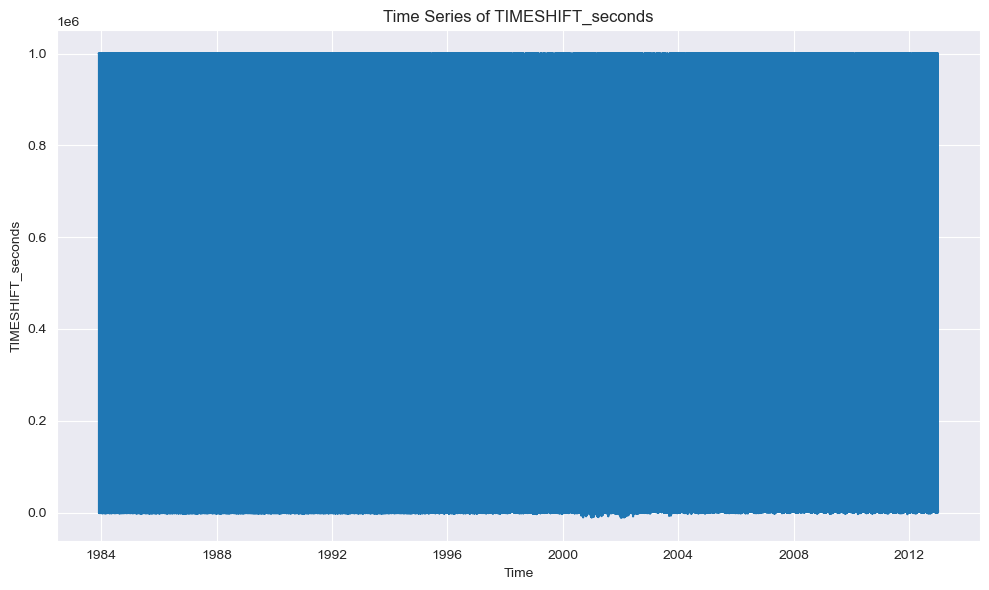

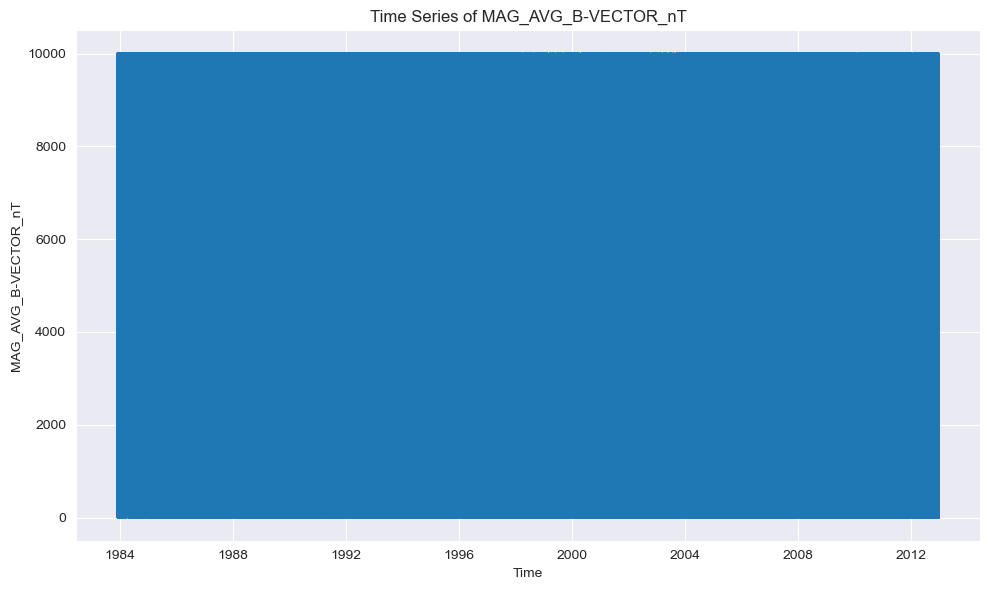

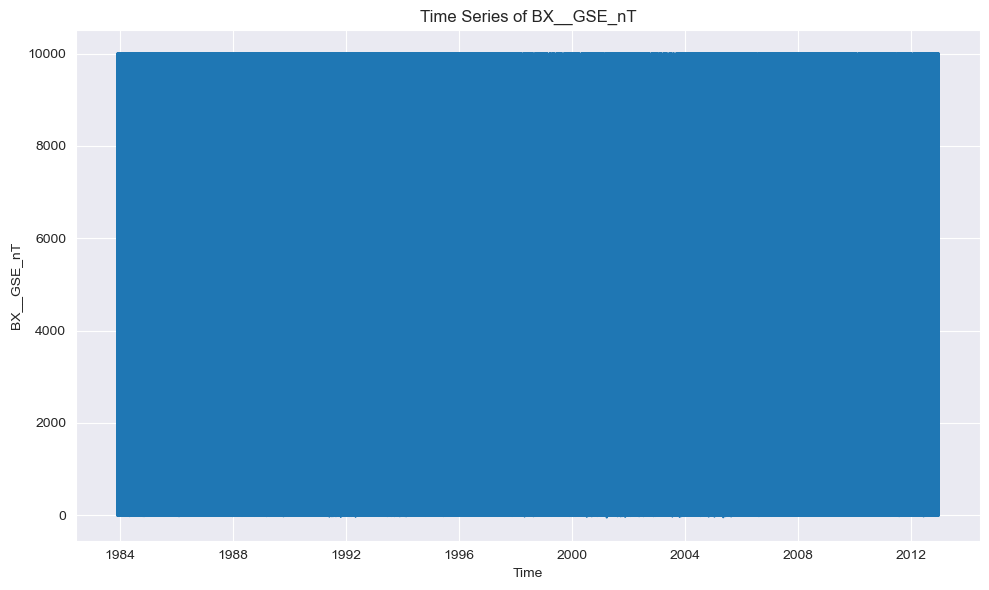

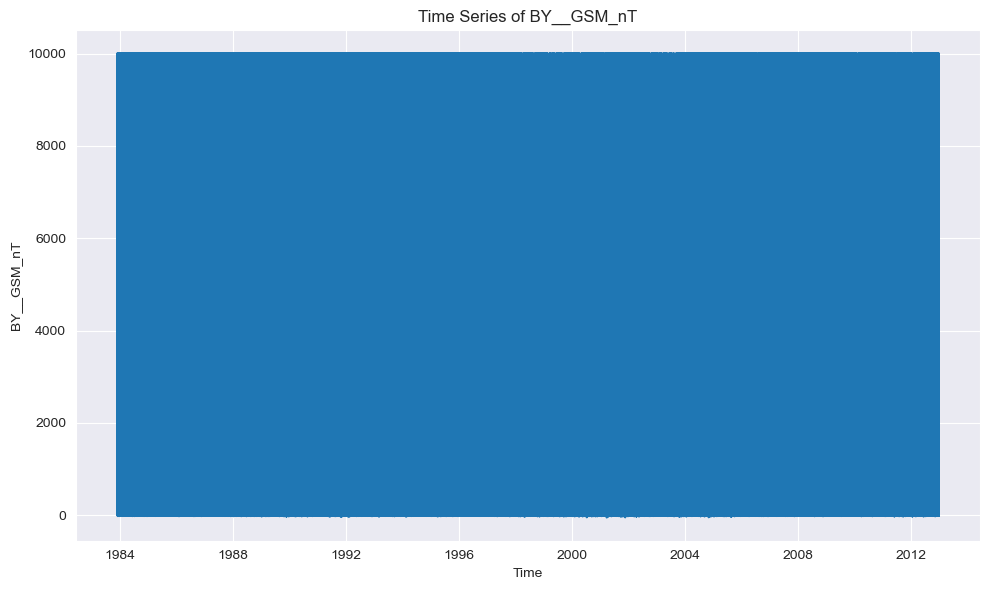

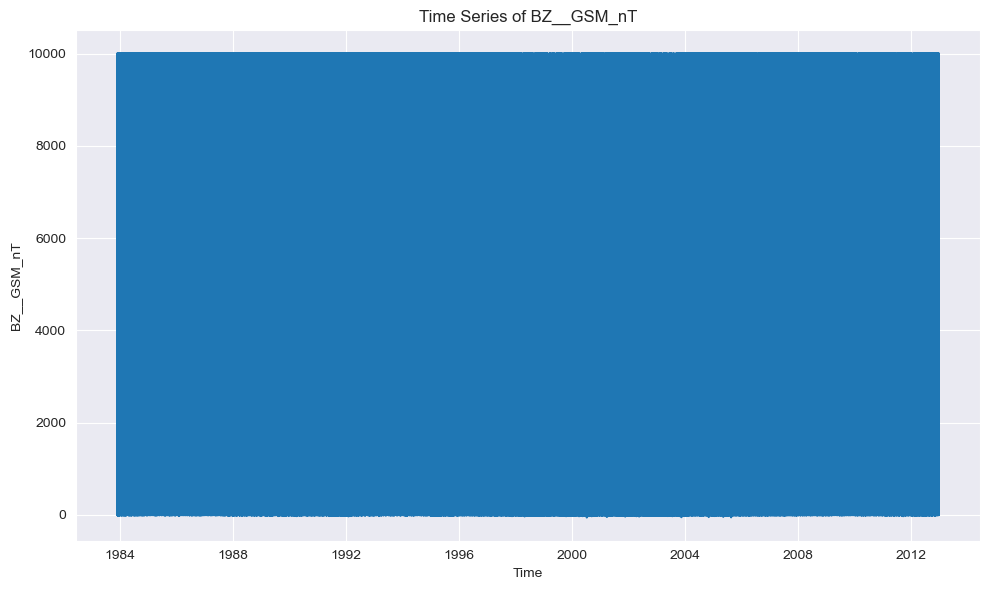

...

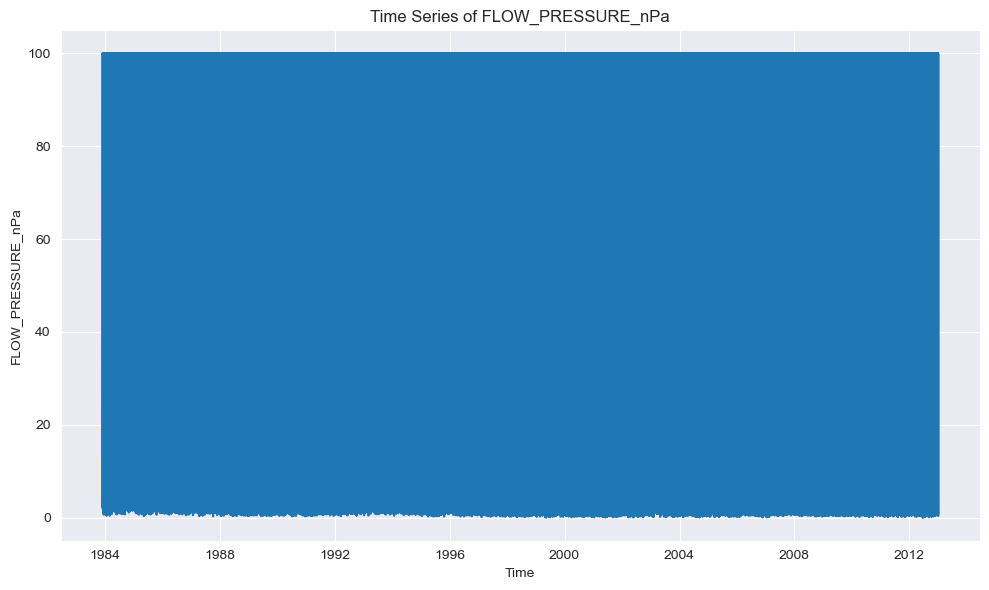

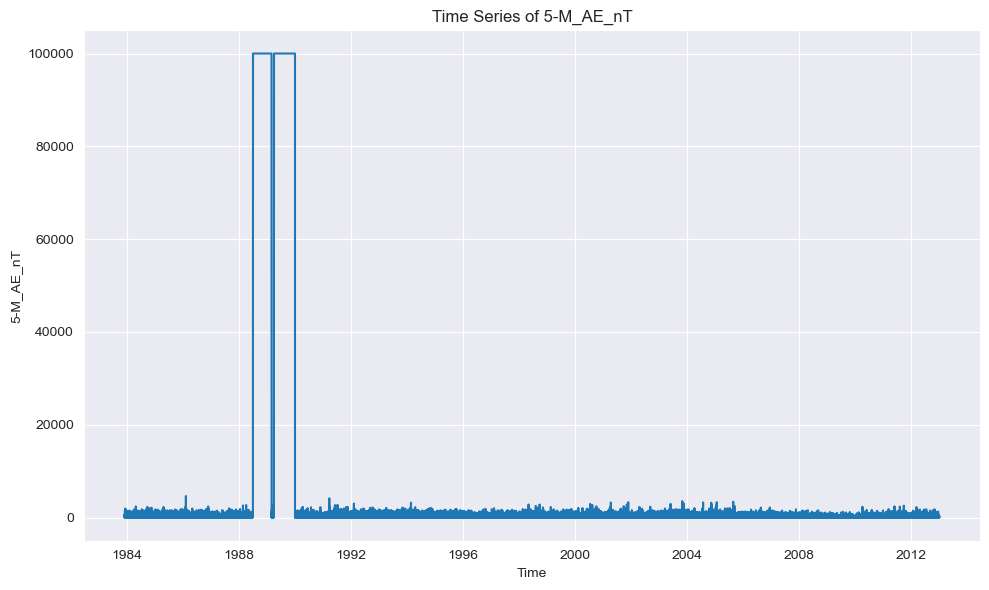

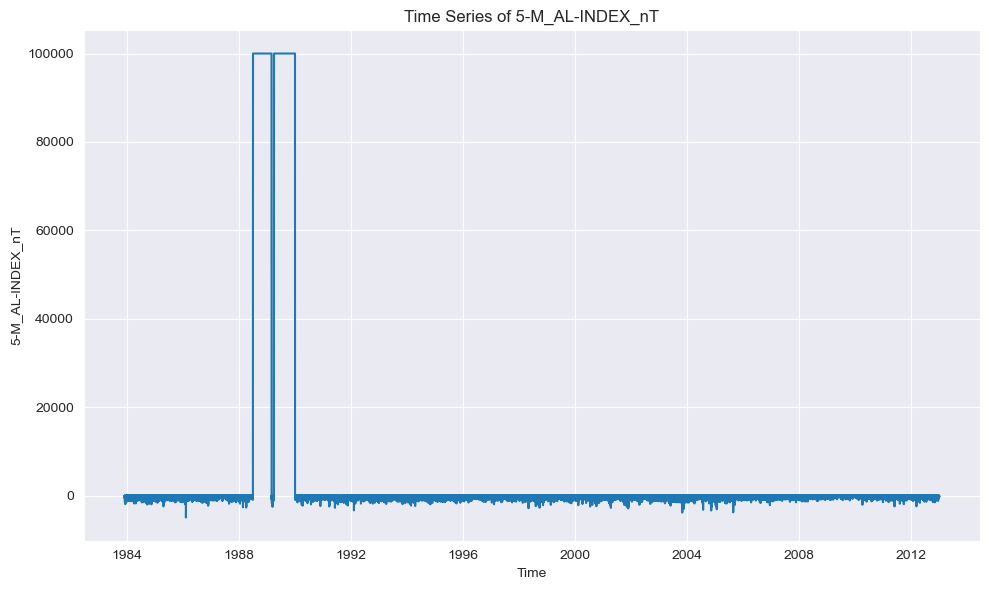

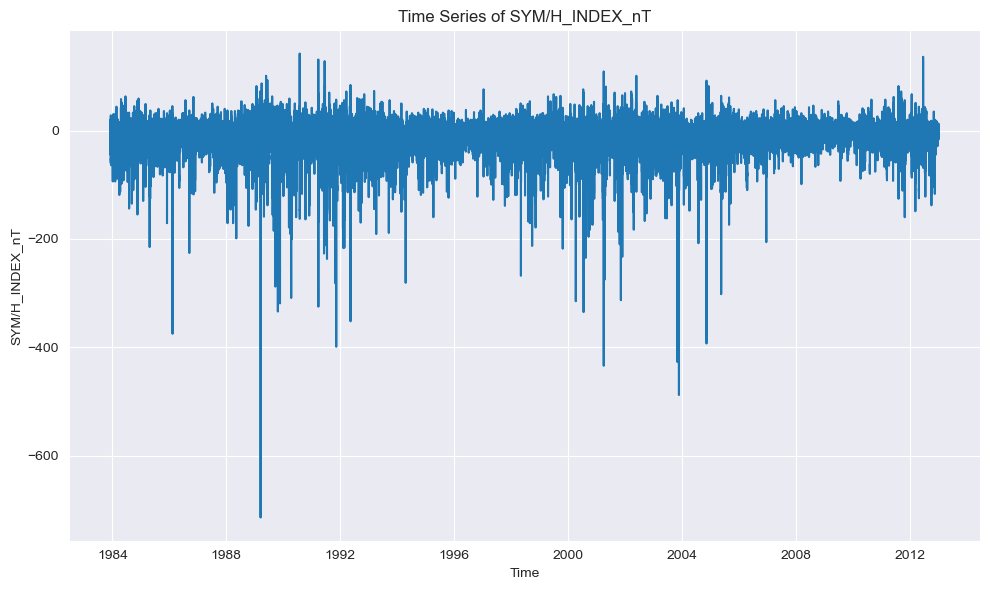

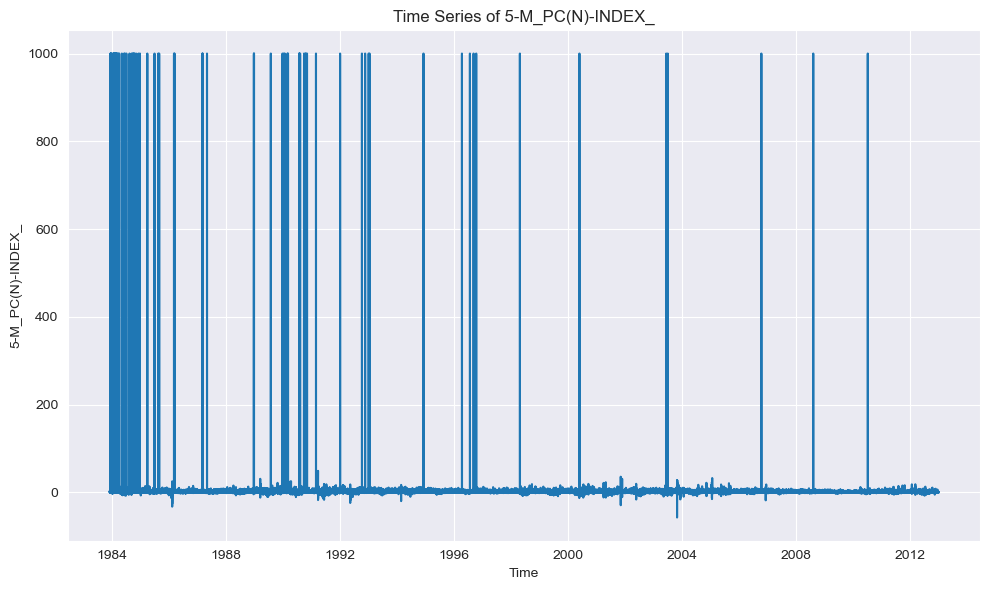

In [3]:
def plot_all_columns(df):
    """
    Plots all columns in the provided DataFrame against the given time column.
    Each column (except the specified time column) will be plotted on its own figure.
    
    Parameters:
        df (pd.DataFrame): The DataFrame containing the time column and other data columns.
        time_col (str): The name of the time column in df.
    """
    # Assume 'time_col' is the name of your datetime column
    time_col = 'EPOCH_TIME_yyyy-mm-ddThh:mm:ss.sssZ'
    # Ensure the time column is in the DataFrame
    if time_col not in df.columns:
        raise ValueError(f"Column '{time_col}' not found in DataFrame.")

    # Plot each column separately, skipping the time column
    for col in df.columns:
        if col != time_col:
            plt.figure(figsize=(10, 6))
            plt.plot(df[time_col], df[col])
            plt.xlabel('Time')
            plt.ylabel(col)
            plt.title(f'Time Series of {col}')
            plt.tight_layout()
            plt.show()
plot_all_columns(fiveOmni_df)

In [4]:
fiveOmni_df.describe()
#print(fiveOmni_df.columns)

,TIMESHIFT_seconds,MAG_AVG_B-VECTOR_nT,BX__GSE_nT,BY__GSM_nT,BZ__GSM_nT,FLOW_SPEED__GSE_km/s,VX_VELOCITY__GSE_km/s,VY_VELOCITY__GSE_km/s,VZ_VELOCITY__GSE_km/s,PROTON_DENSITY_n/cc,FLOW_PRESSURE_nPa,5-M_AE_nT,5-M_AL-INDEX_nT,SYM/H_INDEX_nT,5-M_PC(N)-INDEX_
count,3.059713e+06,3.059713e+06,3.059713e+06,3.059713e+06,3.059713e+06,3.059713e+06,3.059713e+06,3.059713e+06,3.059713e+06,3.059713e+06,3.059713e+06,3.059713e+06,3.059713e+06,3.059713e+06,3.059713e+06
mean,3.014755e+05,3.004203e+03,2.999988e+03,2.999940e+03,2.999952e+03,3.284622e+04,3.225945e+04,3.255115e+04,3.255120e+04,3.299682e+02,3.386834e+01,5.067416e+03,4.756593e+03,-1.400732e+01,1.246132e+00
std,4.572879e+05,4.579762e+03,4.582522e+03,4.582554e+03,4.582546e+03,4.665296e+04,4.706060e+04,4.685787e+04,4.685784e+04,4.654969e+02,4.572926e+01,2.149354e+04,2.156342e+04,2.211977e+01,1.352546e+01
min,-1.079700e+04,1.700000e-01,-4.857000e+01,-4.797000e+01,-5.878000e+01,2.097000e+02,-1.135100e+03,-8.623000e+02,-2.821000e+02,3.000000e-02,1.000000e-02,1.000000e+00,-4.918000e+03,-7.140000e+02,-5.725000e+01
25%,1.062000e+03,4.610000e+00,-1.570000e+00,-1.600000e+00,-9.800000e-01,3.831000e+02,-4.453000e+02,-1.040000e+01,-7.400000e+00,4.050000e+00,1.510000e+00,5.200000e+01,-1.620000e+02,-2.200000e+01,1.100000e-01
50%,3.294000e+03,6.890000e+00,2.460000e+00,2.280000e+00,1.570000e+00,4.889000e+02,-3.581000e+02,9.400000e+00,1.040000e+01,7.940000e+00,2.660000e+00,1.250000e+02,-5.100000e+01,-1.000000e+01,6.900000e-01
75%,9.999990e+05,9.999990e+03,9.999990e+03,9.999990e+03,9.999990e+03,9.999990e+04,9.999990e+04,9.999990e+04,9.999990e+04,9.999900e+02,9.999000e+01,3.190000e+02,-1.800000e+01,-1.000000e+00,1.700000e+00
max,9.999990e+05,9.999990e+03,9.999990e+03,9.999990e+03,9.999990e+03,9.999990e+04,9.999990e+04,9.999990e+04,9.999990e+04,9.999900e+02,9.999000e+01,9.999900e+04,9.999900e+04,1.420000e+02,9.999900e+02


# Data Cleaning

In [5]:
# Define thresholds for "impossible" values for each column
# These are example thresholds and should be adjusted as appropriate:
mask_time = fiveOmni_df['EPOCH_TIME_yyyy-mm-ddThh:mm:ss.sssZ'].notna()  # Just ensure time is not NaT
#mask_timeshift = fiveOmni_df['TIMESHIFT_seconds'] < 9999
mask_mag = fiveOmni_df['MAG_AVG_B-VECTOR_nT'] < 999
mask_bx = fiveOmni_df['BX__GSE_nT'] < 999
mask_by = fiveOmni_df['BY__GSM_nT'] < 999
mask_bz = fiveOmni_df['BZ__GSM_nT'] < 999
mask_speed = fiveOmni_df['FLOW_SPEED__GSE_km/s'] < 9999
mask_vx = fiveOmni_df['VX_VELOCITY__GSE_km/s'] < 9999
mask_vy = fiveOmni_df['VY_VELOCITY__GSE_km/s'] < 9999
mask_vz = fiveOmni_df['VZ_VELOCITY__GSE_km/s'] < 9999
mask_flow = fiveOmni_df['FLOW_PRESSURE_nPa'] < 9999
mask_ae = fiveOmni_df['5-M_AE_nT'] < 9999 
mask_al = fiveOmni_df['5-M_AL-INDEX_nT'] < 9999
mask_pc = fiveOmni_df['5-M_PC(N)-INDEX_'] < 999

# Combine all masks
valid_mask = (mask_time & mask_mag & mask_bx & mask_by & mask_bz & mask_speed & mask_vx & mask_vy & mask_vz & mask_flow & mask_ae & mask_al & mask_pc)

# Apply the mask to filter the DataFrame
fiveOmni_df_cleaned = fiveOmni_df[valid_mask]
fiveOmni_df_cleaned.describe()

,TIMESHIFT_seconds,MAG_AVG_B-VECTOR_nT,BX__GSE_nT,BY__GSM_nT,BZ__GSM_nT,FLOW_SPEED__GSE_km/s,VX_VELOCITY__GSE_km/s,VY_VELOCITY__GSE_km/s,VZ_VELOCITY__GSE_km/s,PROTON_DENSITY_n/cc,FLOW_PRESSURE_nPa,5-M_AE_nT,5-M_AL-INDEX_nT,SYM/H_INDEX_nT,5-M_PC(N)-INDEX_
count,2.016795e+06,2.016795e+06,2.016795e+06,2.016795e+06,2.016795e+06,2.016795e+06,2.016795e+06,2.016795e+06,2.016795e+06,2.016795e+06,2.016795e+06,2.016795e+06,2.016795e+06,2.016795e+06,2.016795e+06
mean,2.189434e+03,6.040778e+00,4.087705e-02,1.495860e-02,-9.302978e-03,4.354915e+02,-4.342104e+02,-1.830091e+00,-1.792478e+00,6.578271e+00,2.267093e+00,1.926347e+02,-1.196129e+02,-1.275097e+01,1.028543e+00
std,1.777909e+03,3.248385e+00,3.787248e+00,4.225378e+00,3.516431e+00,1.050430e+02,1.045751e+02,2.437288e+01,2.280789e+01,5.336204e+00,1.852473e+00,2.152168e+02,1.586712e+02,1.996283e+01,1.436575e+00
min,-1.065300e+04,2.100000e-01,-4.857000e+01,-4.797000e+01,-5.878000e+01,2.097000e+02,-1.135100e+03,-8.623000e+02,-2.821000e+02,3.000000e-02,1.000000e-02,1.000000e+00,-4.918000e+03,-4.880000e+02,-1.807000e+01
25%,3.760000e+02,4.000000e+00,-2.710000e+00,-2.690000e+00,-1.850000e+00,3.569000e+02,-4.915000e+02,-1.610000e+01,-1.400000e+01,3.240000e+00,1.250000e+00,4.700000e+01,-1.620000e+02,-2.000000e+01,1.200000e-01
50%,2.436000e+03,5.340000e+00,6.000000e-02,-3.000000e-02,0.000000e+00,4.114000e+02,-4.102000e+02,-4.200000e+00,-1.300000e+00,5.030000e+00,1.820000e+00,1.070000e+02,-5.300000e+01,-9.000000e+00,6.700000e-01
75%,3.475000e+03,7.180000e+00,2.790000e+00,2.680000e+00,1.850000e+00,4.931000e+02,-3.560000e+02,1.010000e+01,1.080000e+01,8.080000e+00,2.710000e+00,2.640000e+02,-2.000000e+01,-1.000000e+00,1.630000e+00
max,1.076800e+04,7.185000e+01,3.731000e+01,5.357000e+01,6.428000e+01,1.135900e+03,-9.810000e+01,3.199000e+02,4.338000e+02,7.199000e+01,8.951000e+01,4.634000e+03,5.800000e+01,1.360000e+02,3.272000e+01


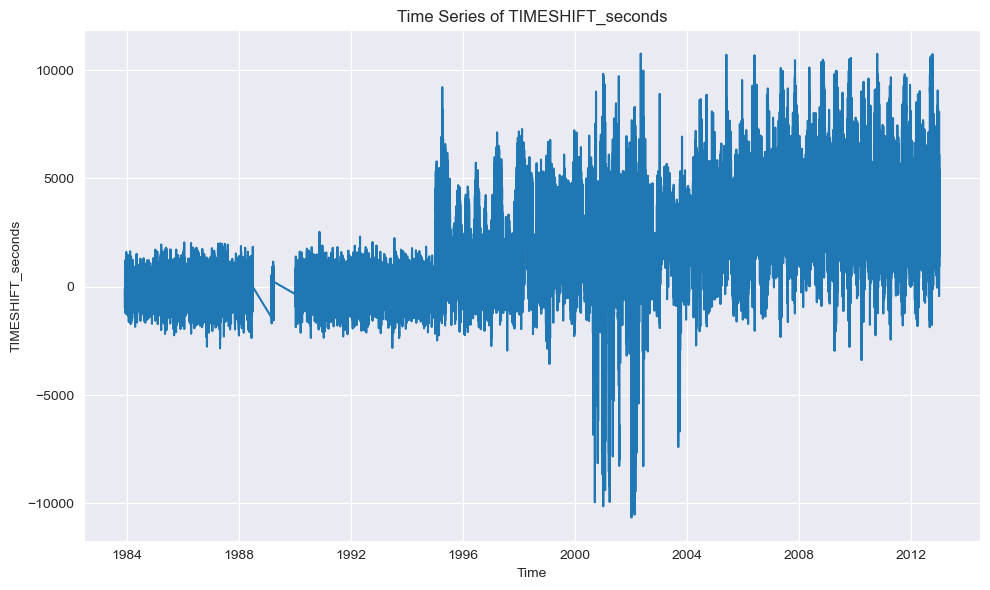

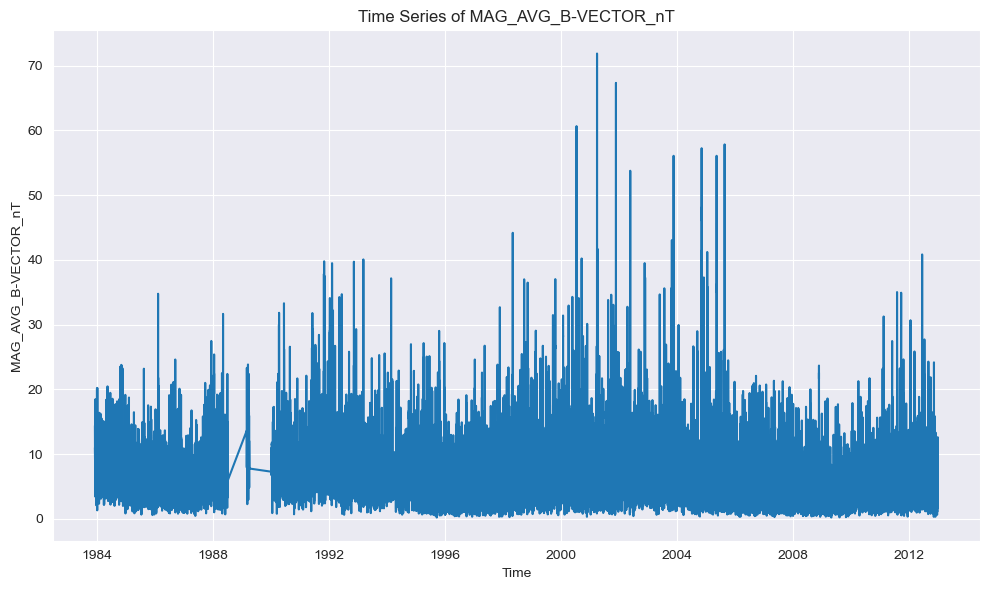

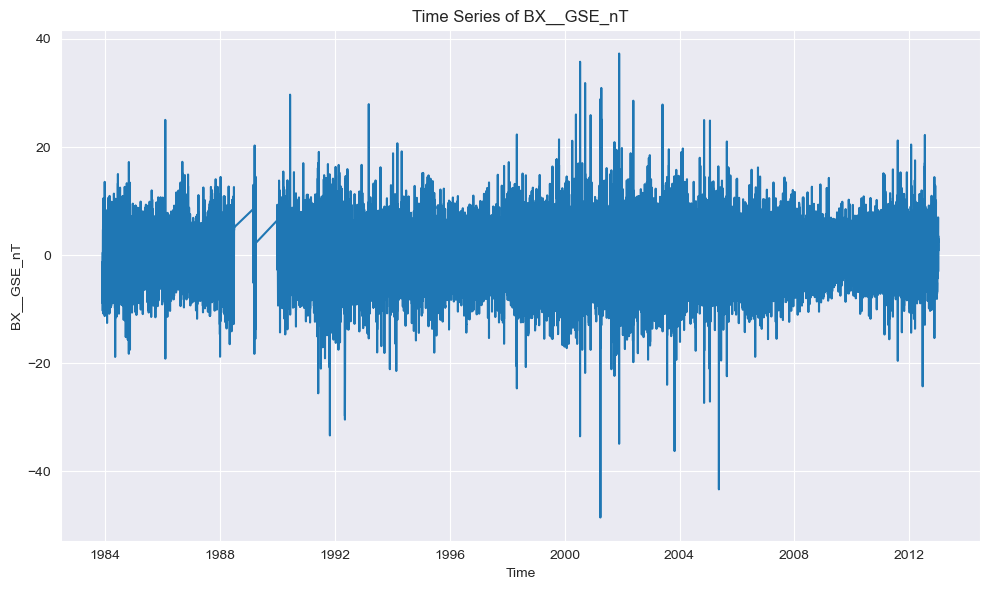

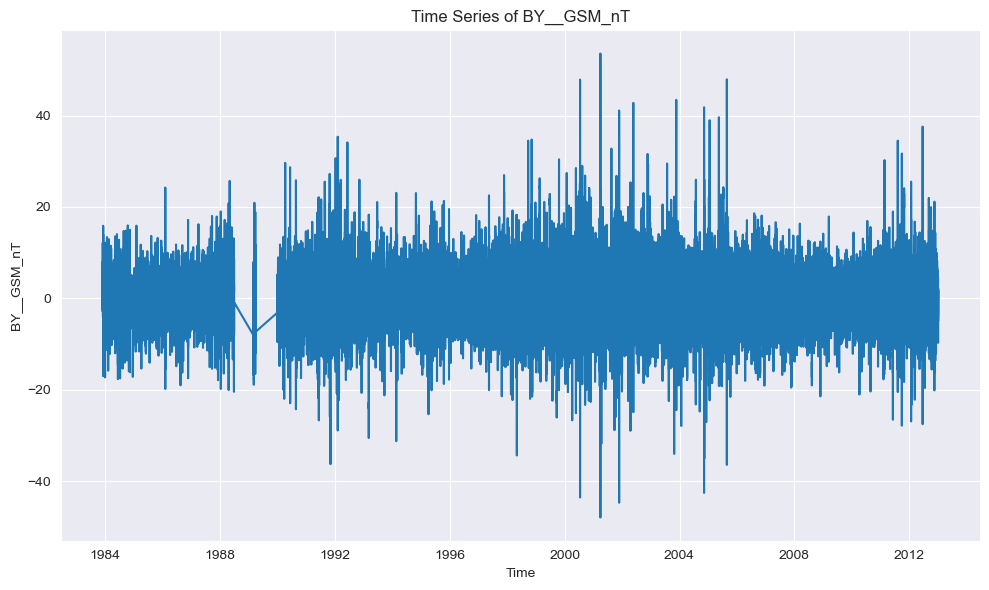

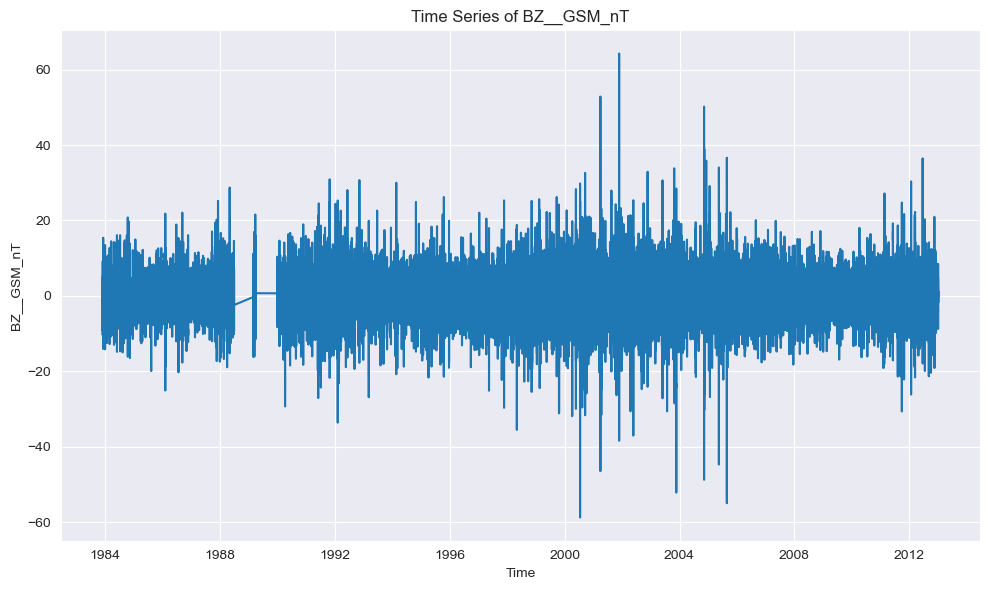

...

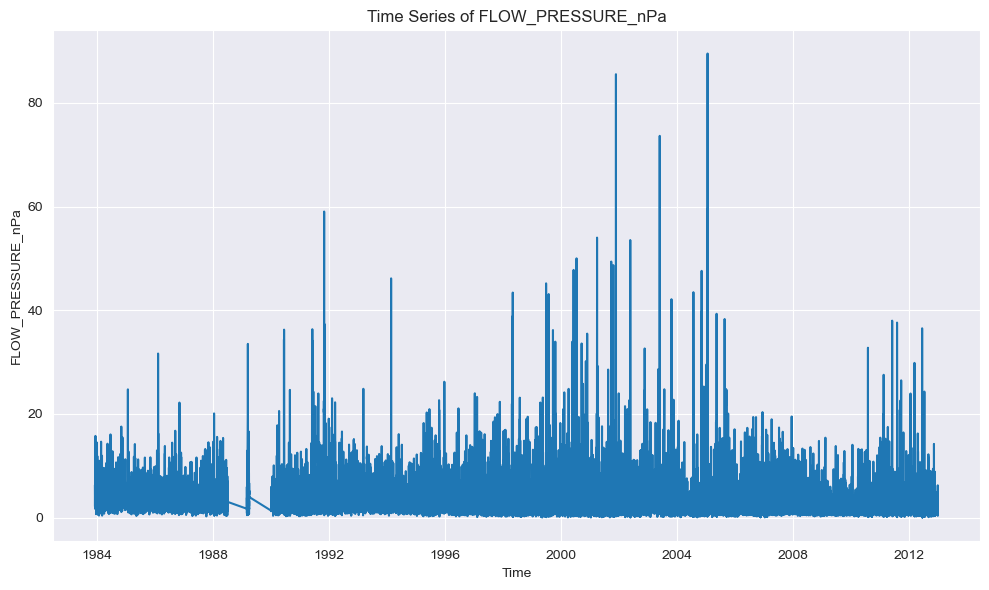

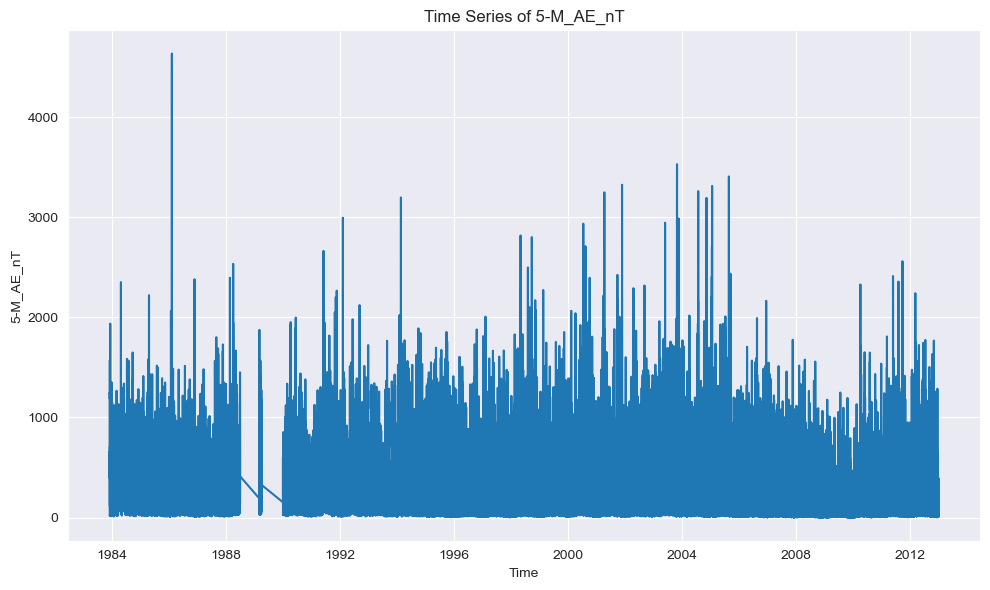

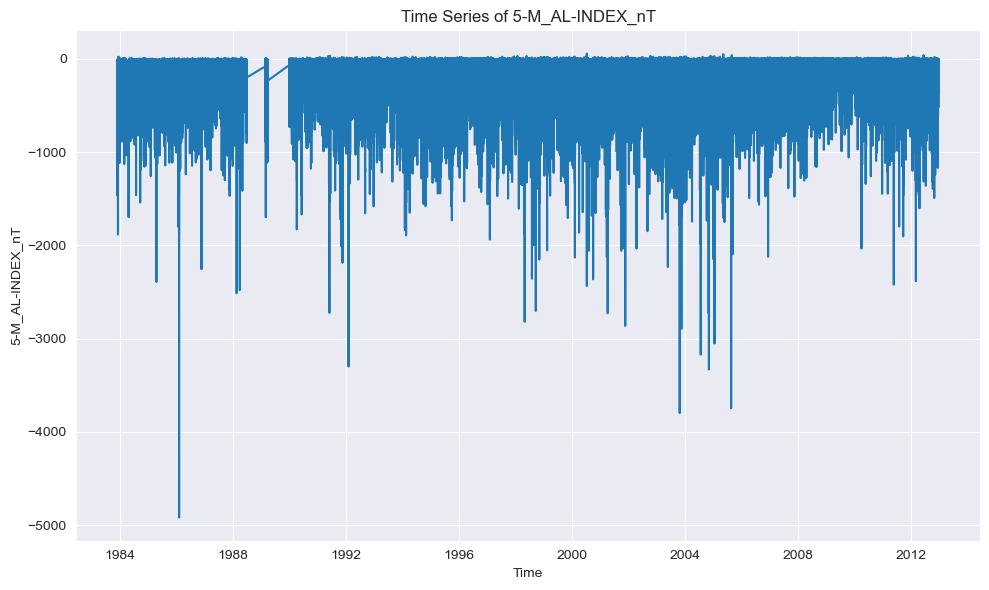

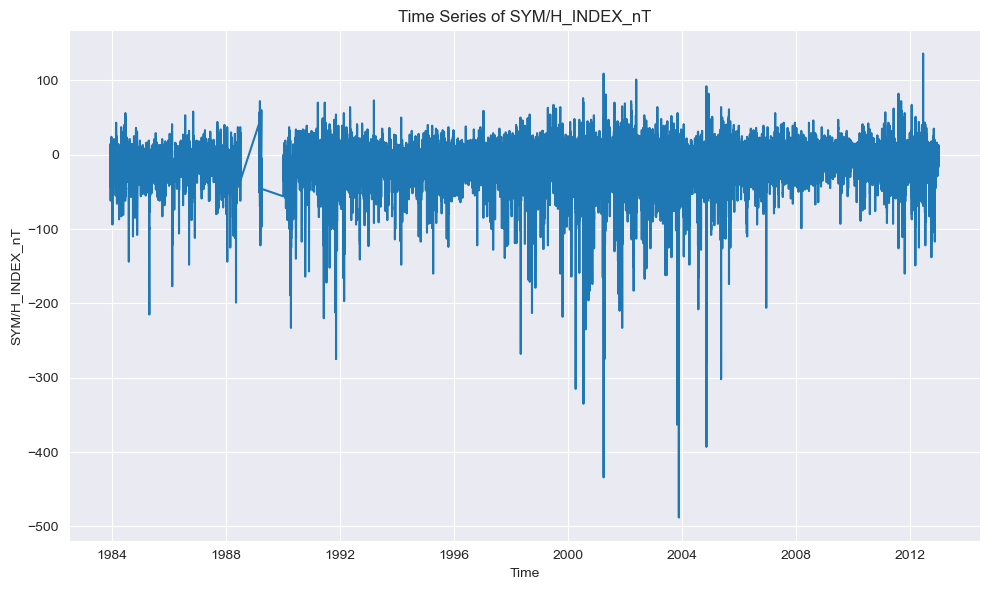

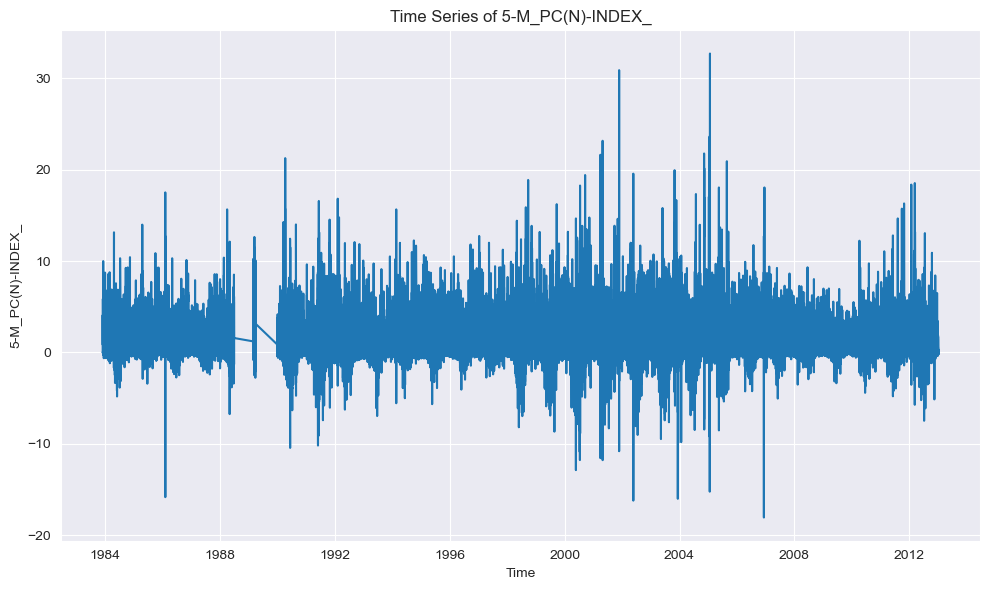

In [6]:
plot_all_columns(fiveOmni_df_cleaned)

/Users/beastxgamer/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


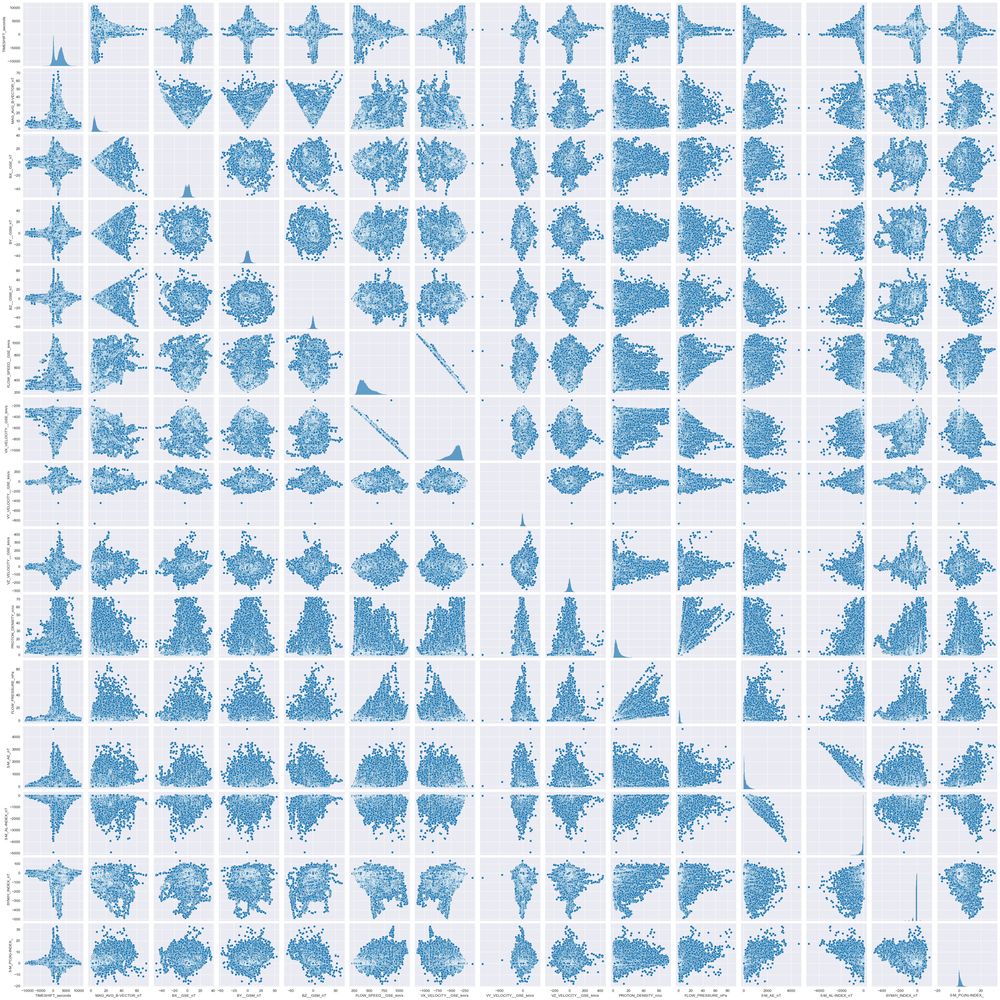

In [7]:
import seaborn as sns
sns.pairplot(fiveOmni_df_cleaned)

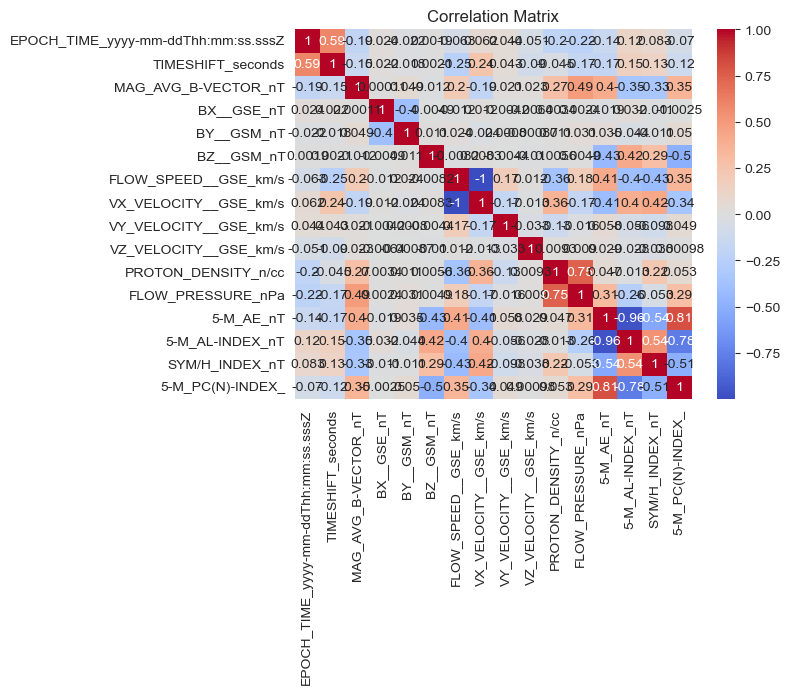

In [8]:
corr_matrix = fiveOmni_df_cleaned.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

In [9]:
ocb_df = pd.read_parquet("data/Nightside.parquet")
ocb_df.describe()

,b1e_date,b1e_geo_lat,b1e_geo_long,b1e_mag_lat,b1e_mag_long,b1e_mlt,b2e_date,b2e_geo_lat,b2e_geo_long,b2e_mag_lat,...,b5i_geo_long,b5i_mag_lat,b5i_mag_long,b5i_mlt,b6_date,b6_geo_lat,b6_geo_long,b6_mag_lat,b6_mag_long,b6_mlt
count,646955,646955.000000,646955.000000,646955.000000,646955.000000,646955.000000,646955,646955.000000,646955.000000,646955.000000,...,646955.000000,646955.000000,646955.000000,646955.000000,646955,646955.000000,646955.000000,646955.000000,646955.000000,646955.000000
mean,1999-12-20 17:51:38.023044864,-9.771289,177.772121,-10.141436,9.024724,14.904802,1999-12-08 15:22:31.236463232,-10.411679,175.511592,-10.628296,...,161.747698,-12.030296,10.413044,14.040886,1999-12-24 05:15:25.779530368,-11.476028,163.979197,-12.090659,10.022252,13.691151
min,1982-12-31 23:59:59,-81.520000,0.000000,-87.450000,-180.000000,0.000000,1982-12-31 23:59:59,-81.520000,0.000000,-89.660000,...,0.000000,-89.410000,-180.000000,0.000000,1983-12-01 00:19:30,-81.520000,0.000000,-89.970000,-180.000000,0.000000
25%,1993-11-10 07:18:34.500000,-65.950000,83.740000,-66.550000,-76.590000,6.510000,1993-11-07 08:21:01.500000,-69.140000,82.320000,-67.590000,...,72.890000,-73.410000,-65.870000,5.990000,1993-11-11 00:14:47.500000,-76.860000,79.620000,-75.250000,-62.940000,5.700000
50%,2000-08-30 18:50:26,-50.260000,170.790000,-60.580000,20.230000,18.300000,2000-08-24 00:46:43,-52.320000,168.540000,-62.980000,...,157.570000,-69.200000,29.480000,17.730000,2000-09-02 16:23:07,-61.150000,156.400000,-70.220000,30.450000,17.200000
75%,2006-05-04 08:06:50,62.730000,276.480000,65.460000,89.140000,20.380000,2006-04-09 13:46:21.500000,64.560000,271.000000,66.870000,...,236.200000,72.440000,86.925000,20.270000,2006-05-06 11:05:48.500000,73.510000,240.340000,74.610000,83.930000,20.220000
max,2012-12-31 22:34:38,81.510000,360.000000,88.210000,180.000000,24.000000,2012-12-31 22:19:20,81.520000,360.000000,89.500000,...,360.000000,89.660000,180.000000,24.000000,2012-12-31 22:18:34,81.520000,360.000000,90.000000,180.000000,24.000000
std,NaN,63.160008,107.567610,64.569194,99.384460,6.978363,NaN,65.033449,106.818833,66.338995,...,101.845926,72.448571,96.436233,7.600493,NaN,72.390237,100.117665,74.601902,94.562623,7.732760


In [10]:
fiveOmni_df_cleaned.head()

,EPOCH_TIME_yyyy-mm-ddThh:mm:ss.sssZ,TIMESHIFT_seconds,MAG_AVG_B-VECTOR_nT,BX__GSE_nT,BY__GSM_nT,BZ__GSM_nT,FLOW_SPEED__GSE_km/s,VX_VELOCITY__GSE_km/s,VY_VELOCITY__GSE_km/s,VZ_VELOCITY__GSE_km/s,PROTON_DENSITY_n/cc,FLOW_PRESSURE_nPa,5-M_AE_nT,5-M_AL-INDEX_nT,SYM/H_INDEX_nT,5-M_PC(N)-INDEX_
1154,1983-12-05 00:10:00+00:00,-842,10.98,-5.79,8.04,-2.75,378.0,-377.1,-24.0,-1.9,7.56,2.17,27,-10,13,0.03
1155,1983-12-05 00:15:00+00:00,-864,10.53,-6.15,7.20,-0.74,383.2,-382.4,-21.0,-0.8,9.69,2.85,22,-10,14,-0.03
1156,1983-12-05 00:20:00+00:00,-867,12.10,-7.53,6.45,5.38,379.7,-377.4,-35.2,17.6,9.93,2.89,28,-9,13,0.45
1157,1983-12-05 00:25:00+00:00,-832,11.35,-6.58,8.10,0.93,396.0,-393.4,-42.3,13.0,9.77,3.06,33,-10,12,0.72
1158,1983-12-05 00:30:00+00:00,-841,11.53,-6.40,8.35,0.12,381.6,-378.4,-41.0,24.8,14.58,4.24,29,-7,12,0.60


In [17]:
# Convert time columns to datetime format
ocb_df['b6_date'] = pd.to_datetime(ocb_df['b6_date'], errors='coerce')  # Handles invalid dates with NaT
fiveOmni_df_cleaned['EPOCH_TIME_yyyy-mm-ddThh:mm:ss.sssZ'] = pd.to_datetime(
    fiveOmni_df_cleaned['EPOCH_TIME_yyyy-mm-ddThh:mm:ss.sssZ'], utc=True)

# Sort both DataFrames by the datetime column
ocb_df = ocb_df.sort_values('b6_date')
fiveOmni_df_cleaned = fiveOmni_df_cleaned.sort_values('EPOCH_TIME_yyyy-mm-ddThh:mm:ss.sssZ')


# Remove timezone from the EPOCH_TIME column to match naive datetime
fiveOmni_df_cleaned['EPOCH_TIME_yyyy-mm-ddThh:mm:ss.sssZ'] = \
    fiveOmni_df_cleaned['EPOCH_TIME_yyyy-mm-ddThh:mm:ss.sssZ'].dt.tz_localize(None)
fiveOmni_df_cleaned.to_parquet("data/5minOMNI.parquet")
# Merge using merge_asof with a tolerance of 5 minutes
five_merged_df = pd.merge_asof(
    ocb_df,
    fiveOmni_df_cleaned,
    left_on='b6_date',
    right_on='EPOCH_TIME_yyyy-mm-ddThh:mm:ss.sssZ',
    tolerance=pd.Timedelta('5 minutes'),
    direction='nearest'
)

five_merged_df.head()

,b1e_date,b1e_geo_lat,b1e_geo_long,b1e_mag_lat,b1e_mag_long,b1e_mlt,b2e_date,b2e_geo_lat,b2e_geo_long,b2e_mag_lat,...,FLOW_SPEED__GSE_km/s,VX_VELOCITY__GSE_km/s,VY_VELOCITY__GSE_km/s,VZ_VELOCITY__GSE_km/s,PROTON_DENSITY_n/cc,FLOW_PRESSURE_nPa,5-M_AE_nT,5-M_AL-INDEX_nT,SYM/H_INDEX_nT,5-M_PC(N)-INDEX_
0,1983-12-01 00:26:53,57.84,339.93,60.64,66.51,0.01,1983-12-01 00:25:42,61.85,342.78,64.19,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1983-12-01 00:27:19,-75.08,232.19,-67.33,-19.79,18.26,1983-12-01 00:27:27,-75.46,231.05,-67.78,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1983-12-01 00:42:19,-48.21,93.51,-62.53,152.94,6.04,1983-12-01 00:41:23,-51.43,94.96,-65.67,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1983-12-01 01:05:47,-76.27,277.06,-63.62,2.66,20.44,1983-12-01 01:06:43,-78.61,266.03,-66.40,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1983-12-01 01:14:21,63.65,57.56,60.59,134.10,5.36,1983-12-01 01:15:51,68.60,52.18,65.23,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


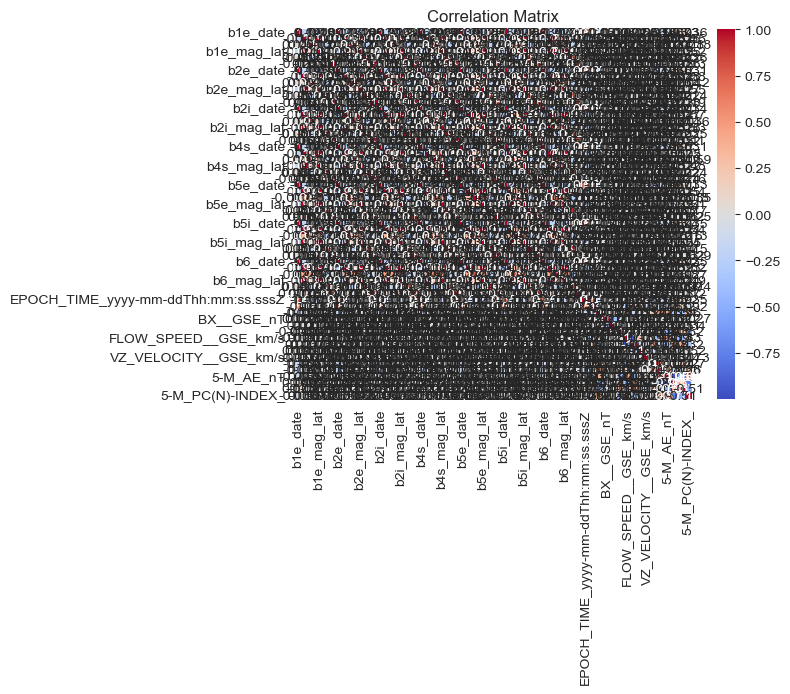

In [12]:
corr_matrix = five_merged_df.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

In [13]:
five_merged_df = five_merged_df.dropna()
five_merged_df.describe()

,b1e_date,b1e_geo_lat,b1e_geo_long,b1e_mag_lat,b1e_mag_long,b1e_mlt,b2e_date,b2e_geo_lat,b2e_geo_long,b2e_mag_lat,...,FLOW_SPEED__GSE_km/s,VX_VELOCITY__GSE_km/s,VY_VELOCITY__GSE_km/s,VZ_VELOCITY__GSE_km/s,PROTON_DENSITY_n/cc,FLOW_PRESSURE_nPa,5-M_AE_nT,5-M_AL-INDEX_nT,SYM/H_INDEX_nT,5-M_PC(N)-INDEX_
count,483943,483943.000000,483943.000000,483943.000000,483943.000000,483943.000000,483943,483943.000000,483943.000000,483943.000000,...,483943.000000,483943.000000,483943.000000,483943.000000,483943.000000,483943.000000,483943.000000,483943.000000,483943.000000,483943.000000
mean,2002-10-31 14:23:44.453725312,-15.572451,178.765413,-15.990386,13.539736,14.965626,2002-10-18 09:01:19.679699712,-16.511905,176.348897,-16.722341,...,441.493922,-440.175263,-1.213140,-1.679902,6.743317,2.361047,215.201666,-136.636346,-13.517668,1.143528
min,1982-12-31 23:59:59,-81.520000,0.000000,-87.450000,-180.000000,0.000000,1982-12-31 23:59:59,-81.520000,0.000000,-89.660000,...,231.800000,-1129.400000,-255.900000,-282.100000,0.090000,0.020000,2.000000,-3032.000000,-475.000000,-16.220000
25%,1998-07-09 17:40:21.500000,-68.110000,80.950000,-66.870000,-64.675000,6.670000,1998-06-20 16:40:46.500000,-71.170000,79.490000,-67.860000,...,360.500000,-500.400000,-16.100000,-14.300000,3.350000,1.340000,54.000000,-191.000000,-21.000000,0.200000
50%,2003-05-20 15:01:22,-52.090000,169.140000,-62.050000,24.880000,18.230000,2003-05-10 10:12:01,-53.900000,166.770000,-63.960000,...,416.800000,-415.500000,-3.900000,-1.200000,5.200000,1.920000,129.000000,-70.000000,-10.000000,0.810000
75%,2007-08-25 17:40:04.500000,61.290000,283.840000,65.270000,90.290000,20.300000,2007-08-12 21:35:19,62.820000,278.240000,66.630000,...,502.000000,-359.500000,11.100000,11.200000,8.300000,2.790000,302.000000,-24.000000,-2.000000,1.810000
max,2012-12-31 22:34:38,81.510000,360.000000,88.210000,180.000000,24.000000,2012-12-31 22:19:20,81.520000,360.000000,89.500000,...,1130.800000,-231.700000,270.800000,419.700000,71.440000,89.510000,3274.000000,41.000000,97.000000,29.080000
std,NaN,62.045432,110.172856,63.470798,97.254654,6.855460,NaN,63.820807,109.406169,65.150619,...,107.206271,106.742984,25.039374,23.173023,5.383610,1.838813,227.164017,169.071431,20.911351,1.457352


Adding what Tom Sotirelis had suggest with the Newell Coupling parameter:

In [14]:
### Newell Coupling parameter (2007) ###

# 1. Extract the solar wind speed (v)
v = five_merged_df['FLOW_SPEED__GSE_km/s']

# 2. Compute BT
five_merged_df['BT'] = np.sqrt(five_merged_df['BY__GSM_nT']**2 + five_merged_df['BZ__GSM_nT']**2)

# 3. Compute clock angle qc (in radians)
# arctan2 takes arguments as arctan2(y, x)
five_merged_df['qc'] = np.arctan2(five_merged_df['BY__GSM_nT'], five_merged_df['BZ__GSM_nT'])

# 4. Compute sin^(8/3)(qc/2)
five_merged_df['sin_term'] = np.sin(five_merged_df['qc'] / 2.0)**(8.0/3.0)

# 5. Compute dFMP/dt
five_merged_df['dFMP_dt'] = (v**(4.0/3.0)) * (five_merged_df['BT']**(2.0/3.0)) * five_merged_df['sin_term']

five_merged_df.describe()

,b1e_date,b1e_geo_lat,b1e_geo_long,b1e_mag_lat,b1e_mag_long,b1e_mlt,b2e_date,b2e_geo_lat,b2e_geo_long,b2e_mag_lat,...,PROTON_DENSITY_n/cc,FLOW_PRESSURE_nPa,5-M_AE_nT,5-M_AL-INDEX_nT,SYM/H_INDEX_nT,5-M_PC(N)-INDEX_,BT,qc,sin_term,dFMP_dt
count,483943,483943.000000,483943.000000,483943.000000,483943.000000,483943.000000,483943,483943.000000,483943.000000,483943.000000,...,483943.000000,483943.000000,483943.000000,483943.000000,483943.000000,483943.000000,483943.000000,483943.000000,242034.000000,242034.000000
mean,2002-10-31 14:23:44.453725312,-15.572451,178.765413,-15.990386,13.539736,14.965626,2002-10-18 09:01:19.679699712,-16.511905,176.348897,-16.722341,...,6.743317,2.361047,215.201666,-136.636346,-13.517668,1.143528,4.713087,-0.016267,0.448816,4203.285129
min,1982-12-31 23:59:59,-81.520000,0.000000,-87.450000,-180.000000,0.000000,1982-12-31 23:59:59,-81.520000,0.000000,-89.660000,...,0.090000,0.020000,2.000000,-3032.000000,-475.000000,-16.220000,0.010000,-3.141593,0.000000,0.000000
25%,1998-07-09 17:40:21.500000,-68.110000,80.950000,-66.870000,-64.675000,6.670000,1998-06-20 16:40:46.500000,-71.170000,79.490000,-67.860000,...,3.350000,1.340000,54.000000,-191.000000,-21.000000,0.200000,2.643728,-1.654680,0.137650,1002.907335
50%,2003-05-20 15:01:22,-52.090000,169.140000,-62.050000,24.880000,18.230000,2003-05-10 10:12:01,-53.900000,166.770000,-63.960000,...,5.200000,1.920000,129.000000,-70.000000,-10.000000,0.810000,4.062032,0.000000,0.417797,3017.425966
75%,2007-08-25 17:40:04.500000,61.290000,283.840000,65.270000,90.290000,20.300000,2007-08-12 21:35:19,62.820000,278.240000,66.630000,...,8.300000,2.790000,302.000000,-24.000000,-2.000000,1.810000,5.928912,1.610380,0.744907,5934.565018
max,2012-12-31 22:34:38,81.510000,360.000000,88.210000,180.000000,24.000000,2012-12-31 22:19:20,81.520000,360.000000,89.500000,...,71.440000,89.510000,3274.000000,41.000000,97.000000,29.080000,56.373543,3.141593,1.000000,120906.366746
std,NaN,62.045432,110.172856,63.470798,97.254654,6.855460,NaN,63.820807,109.406169,65.150619,...,5.383610,1.838813,227.164017,169.071431,20.911351,1.457352,3.188698,1.805485,0.330131,4580.793781


483,943 rows of Data is outstanding in this development!

In [15]:
five_merged_df.to_parquet("data/5minData.parquet")

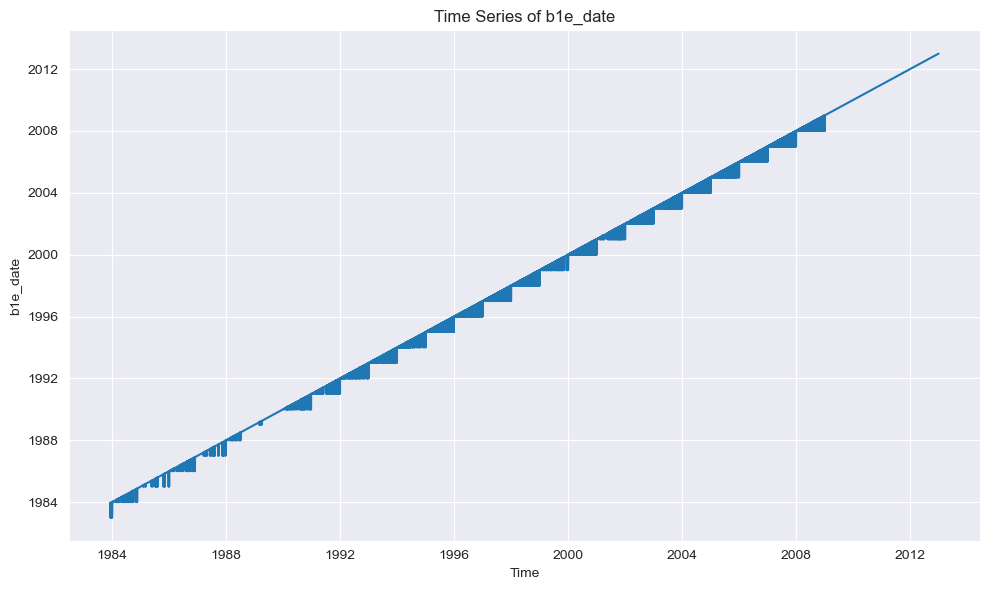

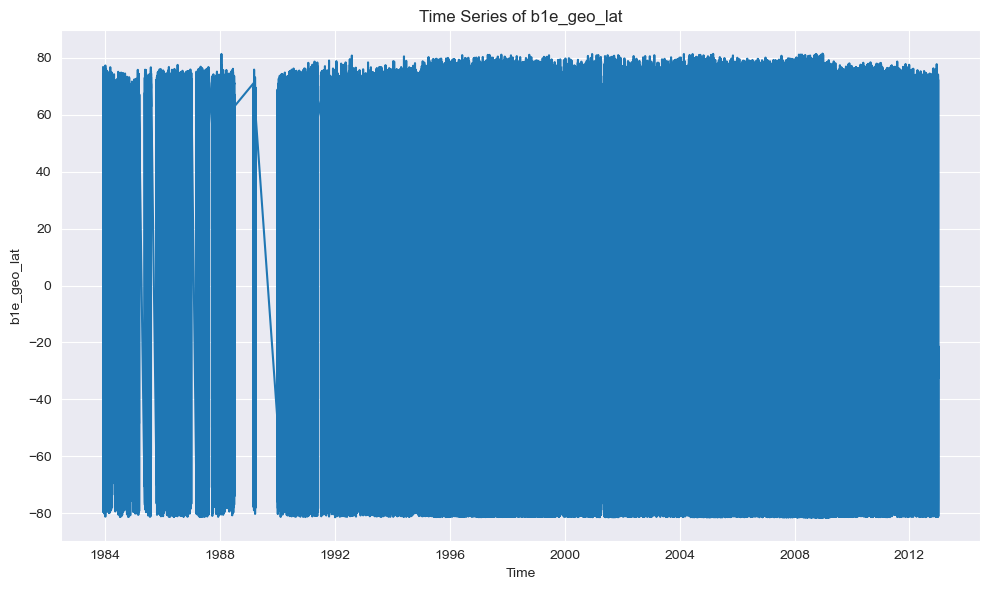

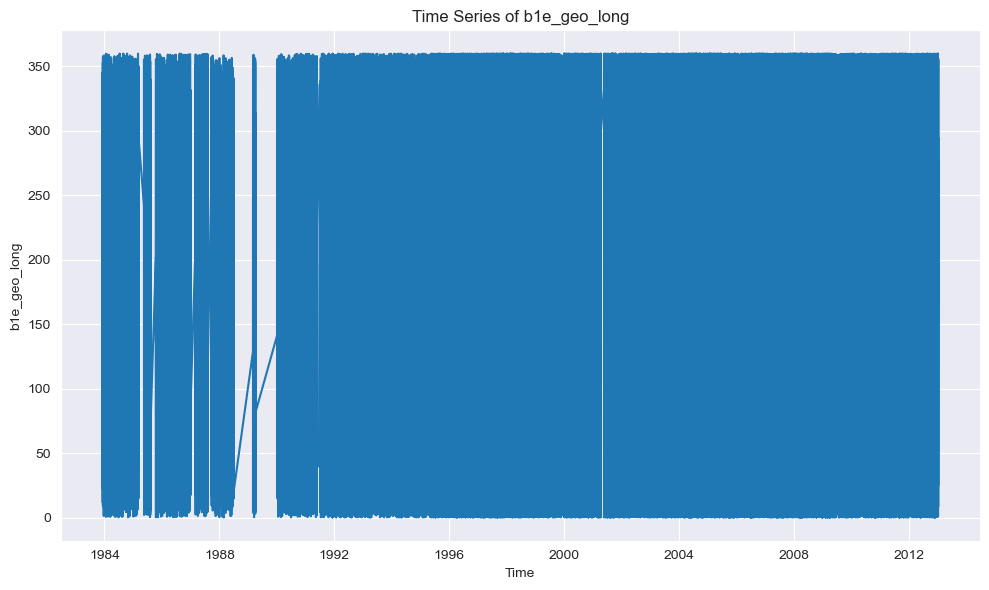

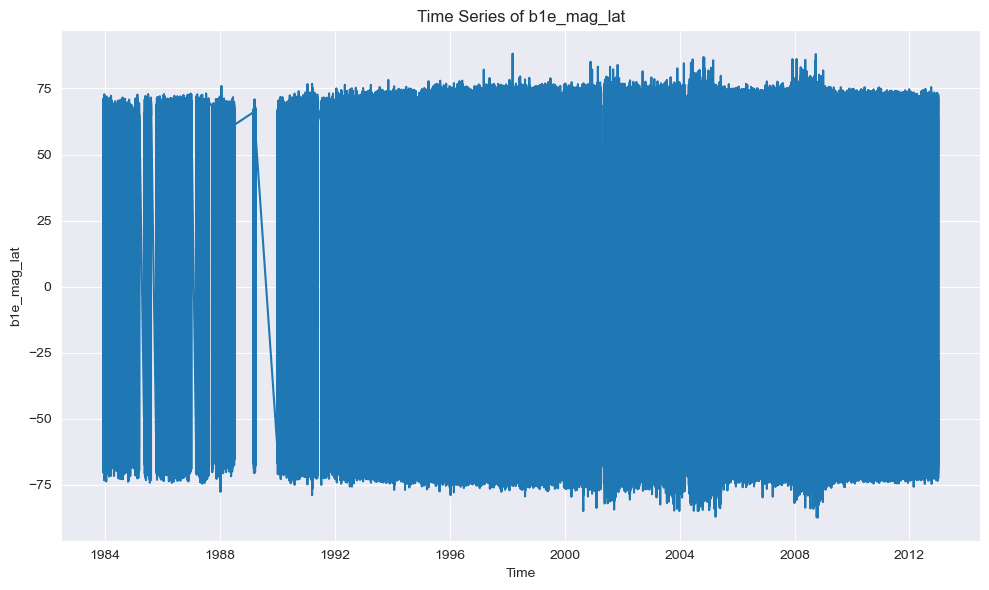

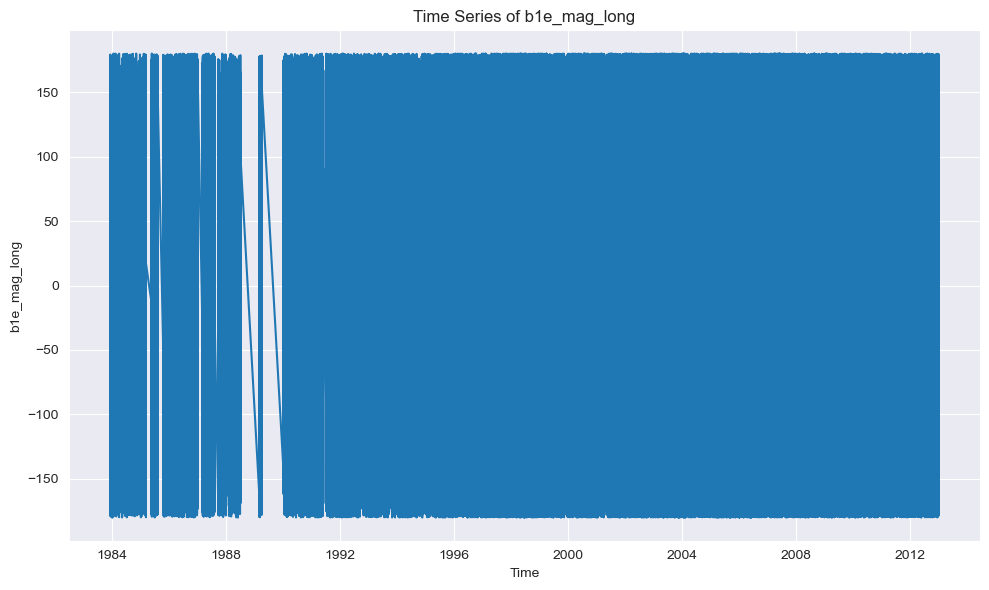

...

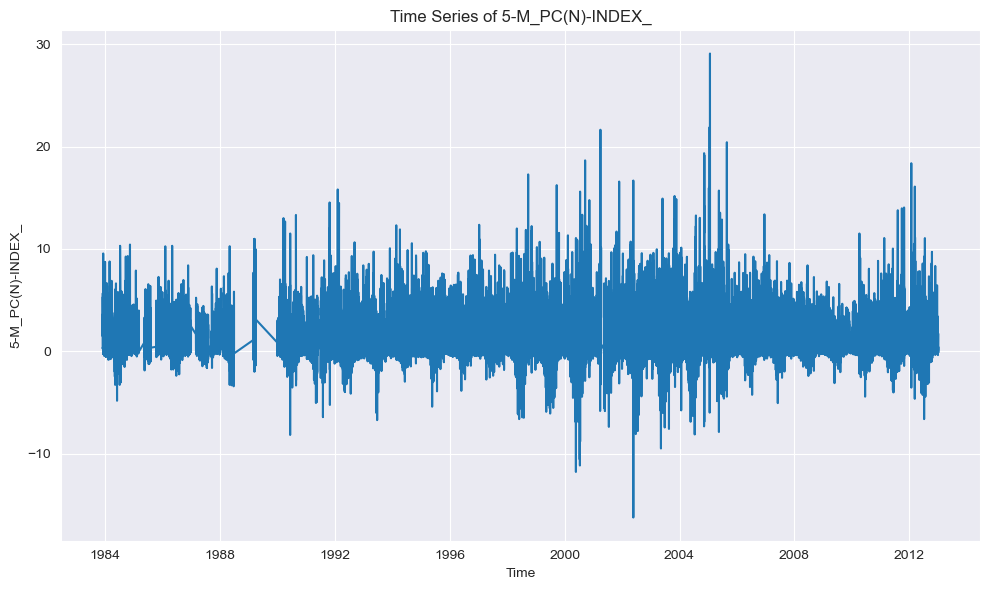

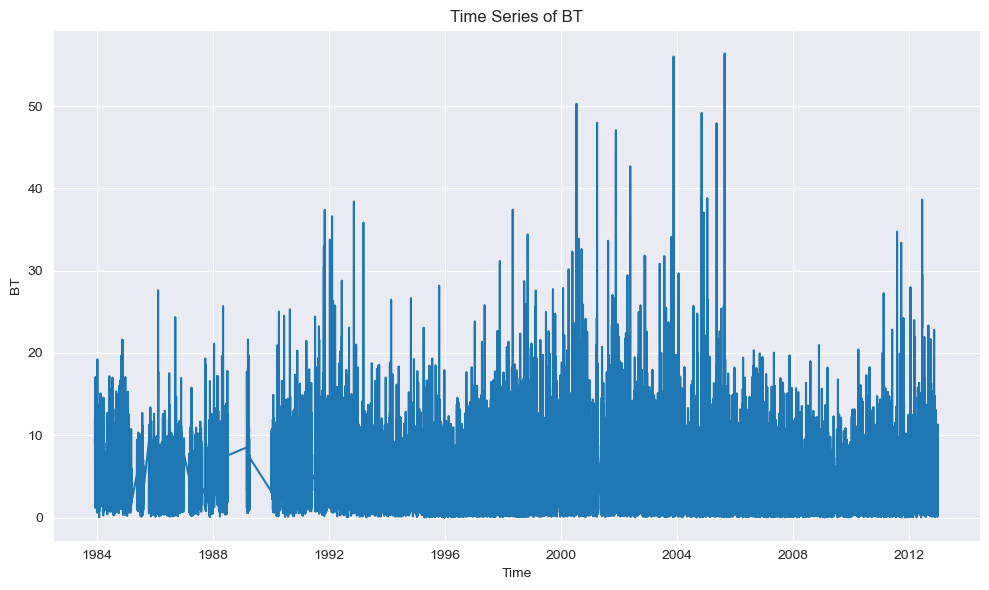

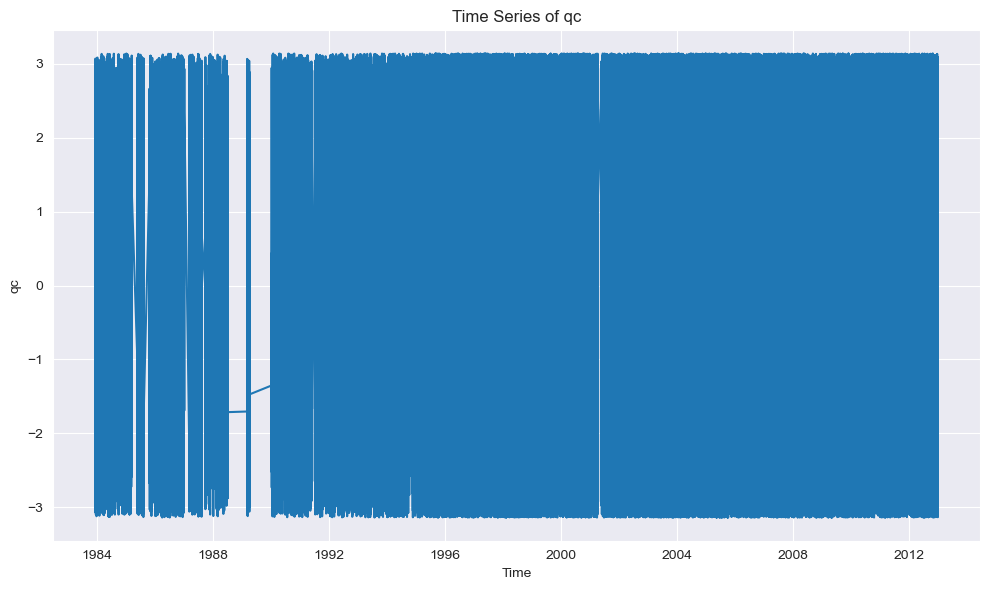

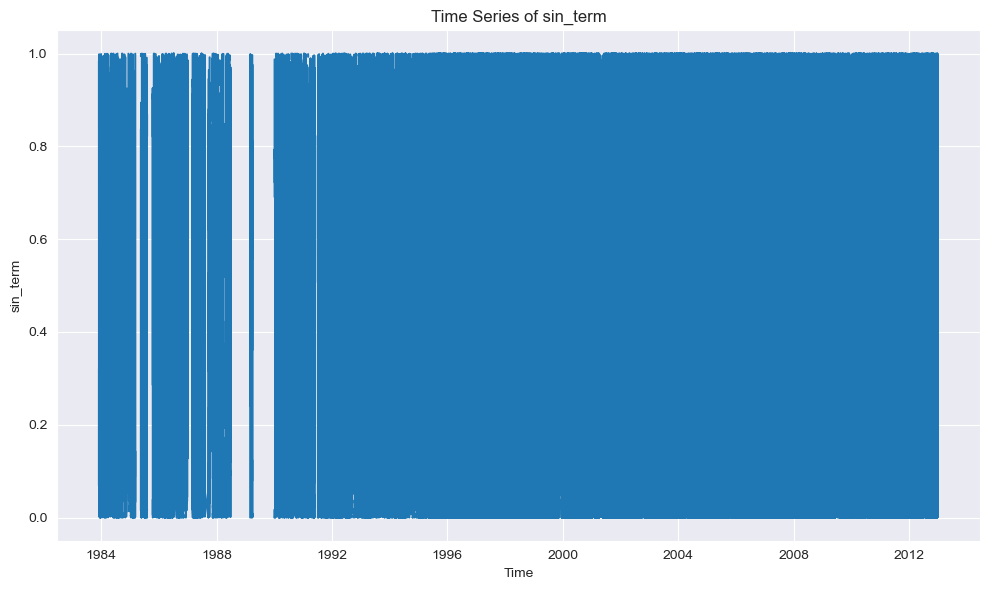

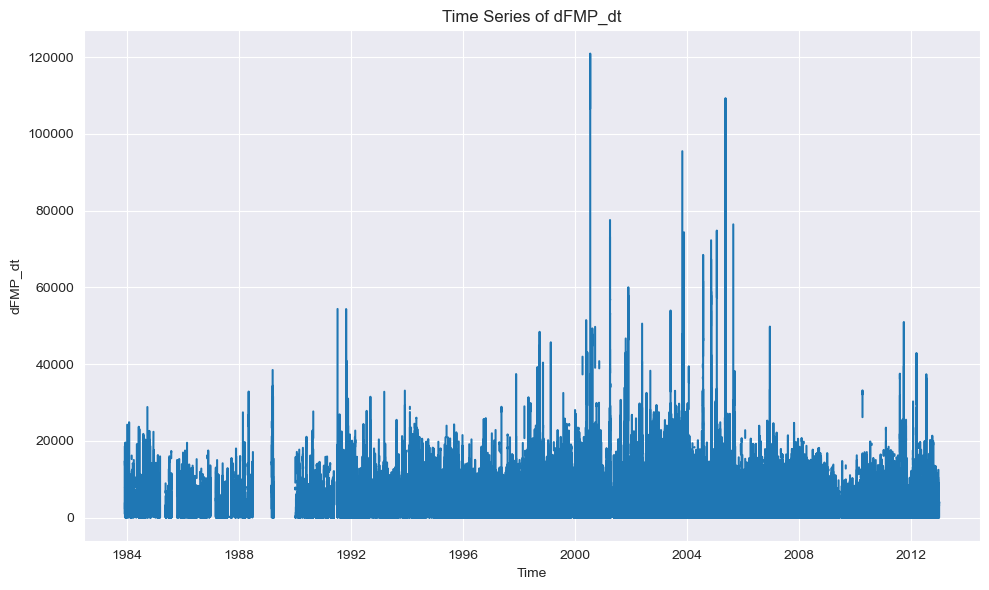

In [16]:
plot_all_columns(five_merged_df)